# Interactive visualization of data across strata

## Learning outcomes

By the end of this chapter you will learn to create interactive visualizations for data stratified with respect to any categorical variable and be able to:

- Explore interactivity in scatter plots so as to use the capabilities to zoom in and out, hover and tooltip, select and highlight
- Create interactive bar plots and heatmaps
- Create dynamic link between different types of plots to each other within a single rich interactive visualization

## Introduction

In the previous sections, we went through a variety of techniques for visualizing data effectively based on the type of features in the dataset, and also learnt how to introduce interactivity in plots using the plotly library. The second section of this course, starting with this lesson, will guide the reader on building interactive visualizations with python in a variety of contexts. 

An observation in the previous chapter was that when it comes to introducing interactivity in python plots, plotly is quite verbose, and consumes significant developer time for relatively easy tasks. Therefore, in this lesson, we introduce `altair`, a library designed especially for generating interactive plots. We will demonstrate how to create interactive visualizations with altair for data grouped with respect to any categorical variable.

For illustration, we will use a publicly available dataset to generate scatter plots and bar plots with the features in the dataset, and add a variety of interactive elements in the plots. We will also learn about some specific advantages of using altair over a more multi-purpose library such as plotly.

We will use the [Happy Planet Index](http://happyplanetindex.org/) (HPI) dataset throughout this lesson. The dataset shows “where in the world people are using ecological resources most efficiently to live long, happy lives”. It is not only an interesting resource for learning more about the ecological condition as well as the socio-economic well-being in various parts of our planet, but also has an interesting mix of features that help us demonstrate certain key concepts in interactive visualization. So, let's dive right in.

## Scatter plots

As you know by now, scatter plots are one of the most essential plots in presenting global patterns within a dataset. Naturally, it is important to know how to introduce interactivity in these plots. We will use first look at the zoom and reset actions.

First, let's have a look at the dataset.

In [1]:
# module for importing data
import pandas as pd

# Download the data from "https://github.com/abha-b/python_viz/blob/master/hpi_data_countries.tsv"
# Once downloaded, read it into a dataframe using pandas
hpi_df = pd.read_csv('hpi_data_countries.tsv', sep='\t')
hpi_df.head()

,HPI Rank,Country,Region,Life Expectancy (years),Wellbeing (0-10),Inequality of outcomes,Ecological Footprint (gha/capita),Happy Planet Index
0,1,Costa Rica,Americas,79.1,7.3,15%,2.8,44.7
1,2,Mexico,Americas,76.4,7.3,19%,2.9,40.7
2,3,Colombia,Americas,73.7,6.4,24%,1.9,40.7
3,4,Vanuatu,Asia Pacific,71.3,6.5,22%,1.9,40.6
4,5,Vietnam,Asia Pacific,75.5,5.5,19%,1.7,40.3


Note that there are 5 numerical/quantitative features in this dataset - `Life Expectancy (years)`, `Wellbeing (0-10)`, `Inequality of outcomes`, `Ecological Footprint (gha/capita)`, `Happy Planet Index`. There are two categorical/nominal features -- _Country_ and _Region_. In altair, the quantitative features are denoted as Q, and nominal features are denoted as N. We will soon see how to use this in our visualizations. But before that, can you recognize what type of feature `HPI rank` is?

It's actually a tricky one. Generally, for the purpose of visualization, if a feature that denotes an attribute like rank has a wide range (roughly more than 10 ranks), one may treat the feature as just another numerical or quantitative feature. But with fewer ranks, it almost acts like a label, and resembles a nominal feature. However, there is one crucial difference in which rank features differ from nominal features -- the order is important in ordinal features. The rank 1 has a different meaning and priority level than the rank 5.

Note that each data point in the HPI dataset corresponds to one country. Before we introduce interactively, let's generate and observe a static scatter plot of the `Wellbeing (0-10)` and `Happy Planet Index` features for each country, with different colors to denote the region to which the country belongs.

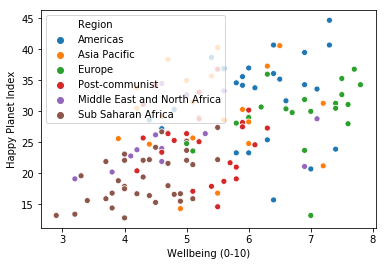

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.add_subplot(111)
ax = sns.scatterplot(x='Wellbeing (0-10)', y='Happy Planet Index', hue='Region', data=hpi_df)
plt.show()

Each dot here represents a country from one of the 7 regions. Both Wellbeing and Happy Planet Index appear correlated. We see a trend in the Happy Planet Index scores and Wellbeing scores of different regions. 

### Zooming in and out

Now, let's generate a similar scatter plot that has a zoom feature. We will be using altair to do this.

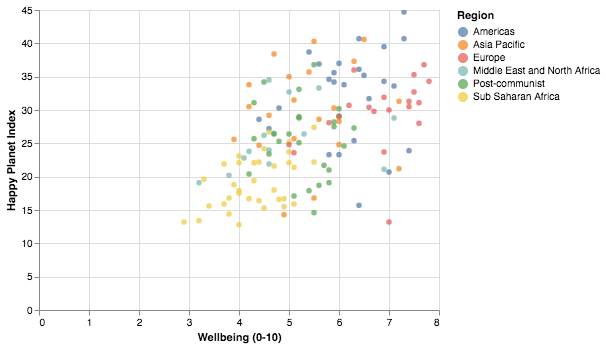

In [3]:
import altair as alt
alt.renderers.enable('notebook')

alt.Chart(hpi_df).mark_circle().encode(
    x='Wellbeing (0-10):Q',
    y='Happy Planet Index:Q',
    color='Region:N',
).interactive()

Looks pretty simple, isn't it? Let's break the simple code down into simpler components since this is our first interactive plot using altair.

1. Import the altair module as alt. 
2. Provide the dataframe of choice (hpi_df in our case) to altair Chart function like so: alt.Chart(hpi_df).
3. Use the mark_circle() function to denote data points in the scatter plot using filled circles. (You can also use the mark_point() function to use empty circles instead of filled ones. Try it.)
4. Use the encode function to specify the features on x, y axes. Although we also used the parameter `color` in this function to color-code the data points using the `region` feature, this is optional.
5. Lastly, add the interactive() function to make the plot interactive for zooming! This does require Jupyter notebook version >=5.3

And that's it. 

Play around a little with that last plot to ensure that you could actually zoom in and out of that plot. 

Did you notice that we added a ':Q' suffix next to our quantitative features and a ':N' suffix next to our nominal feature? Adding suffixes like this helps altair to know the type of feature beforehand, instead of having to infer it by itself. You can also try eliminating the suffixes in this particular plot and find that the plot is still generated without error because altair can guess the type of features in this case. Therefore, it is good practice to include the suffixes since there are cases where altair fails to infer the feature type.

An important concept in altair plots is that of 'encoding' and 'channels'. The concept is really simple -- altair tries to map/encode various aspects of data for a better visualization. This is why you see that there is an encode() function in the code. The various parameters, such as 'x', 'y', 'color', which we specify in the encode function, are called 'channels' in altair. Now that you are aware of these important terminologies, let's look at other interesting forms of interactivity in altair.

Note on altair interactive plots: Notice the three little dots next to your plot? You can use that to save your plot in a .png (static) or .svg (interactive) file, once you have set your interactive plot in the desired cofiguration. However, the interactivity feature in an .svg file will not work unless you open it in a compatible software such as Adode Animate.

### Hover and tooltip

Next, let's look at the hover and tooltip function. We will work with the same scatter plot, but add the ability to hover over any country (data point) and display information regarding the `Region`, `Wellbeing (0-10)`, `Happy Planet Index`, `Life Expectancy (years)` of that country.

#### Exercise 1: Explore Hover and Tooltip functionality in scatter plot

In this exercise, we will learn how to use the hover and tooltip functionalities using altair.

1. Import the altair module as alt.

In [ ]:
import altair as alt

2. Provide the dataframe of choice (hpi_df in our case) to altair Chart function like so: 

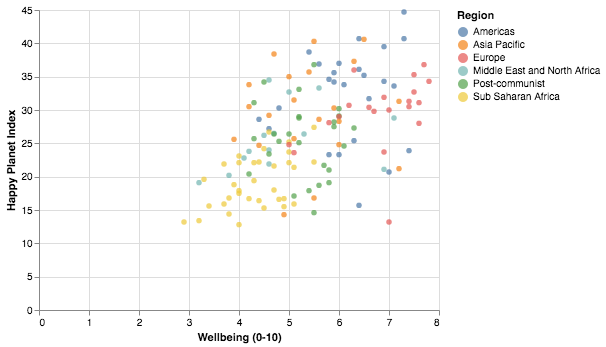

In [4]:
alt.Chart(hpi_df)

3. Use the mark_circle() function to denote data points in the scatter plot using filled circles. (You can also use the mark_point() function to use empty circles instead of filled ones. Try it.)

In [ ]:
alt.Chart(hpi_df).mark_circle()

4. Use the encode function to specify the features on x, y axes. Although we used the parameter color in this function to color-code the data points using the region feature, this is optional. Specify the tooltip channel as shown below

In [ ]:
alt.Chart(hpi_df).mark_circle().encode(
    x='Wellbeing (0-10):Q',
    y='Happy Planet Index:Q',
    color='Region:N',
    tooltip=['Country', 'Region', 'Wellbeing (0-10)', 'Happy Planet Index', 'Life Expectancy (years)'],
)

In the above plot, you find that the features mentioned in the `tooltip` parameter in the encode function are all displayed when the cursor is taken near any data point. However, the zoom function is now lost. How will you bring it back? Simple -- just add the interactive() function!

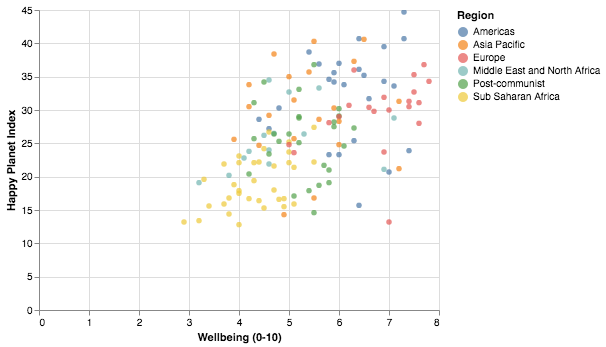

In [5]:
# hover and tooltip in altair
import altair as alt

alt.Chart(hpi_df).mark_circle().encode(
    x='Wellbeing (0-10):Q',
    y='Happy Planet Index:Q',
    color='Region:N',
    tooltip=['Country', 'Region', 'Wellbeing (0-10)', 'Happy Planet Index', 'Life Expectancy (years)'],
).interactive()

### Select and highlight

Now, let's consider a more interesting scenario. Suppose we want to select an area on the plot to examine data points within it. We can do this using a function called add_selection. We first need to define a variable which will store a 'selection interval' and then generate the plot on which we want to add the selection function. In the resultant plot, we can click and then drag cursor to create a selection area that will be colored in gray.

#### Exercise 2: Explore Select and Highlight functionalities in a Scatter plot.

In this exercise, we will learn to use the select and highlight functionalities using altair.

1. Import the altair module as alt.

In [ ]:
import altair as alt

2.	Define variable to store selection interval.

In [ ]:
selected_area = alt.selection_interval()

3.	Provide the dataframe of choice (hpi_df in our case) to altair Chart function like so: 

In [ ]:
alt.Chart(hpi_df)

4.	Use the mark_circle() function to denote data points in the scatter plot using filled circles. (You can also use the mark_point() function to use empty circles instead of filled ones. Try it.)

In [ ]:
alt.Chart(hpi_df).mark_circle()

5.	Use the encode function to specify the features on x, y axes. Although we used the parameter color in this function to color-code the data points using the region feature, this is optional. Use add_selection() function to specify the selected area.

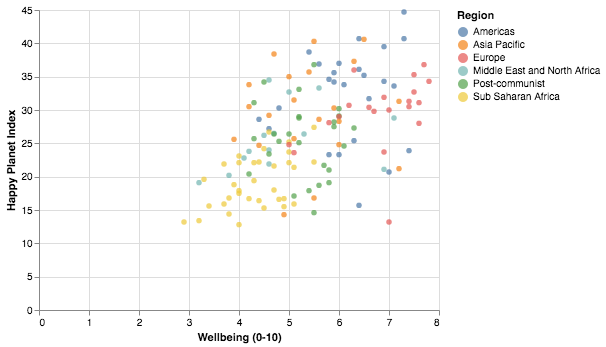

In [6]:
alt.Chart(hpi_df).mark_circle().encode(
    x='Wellbeing (0-10):Q',
    y='Happy Planet Index:Q',
    color='Region:N'
).add_selection(
    selected_area
)

Made sure you can click and drag to create a selection area? Now, let's make the plot respond to our selection by adding focus to our selection and graying out all the points outside of the selection.

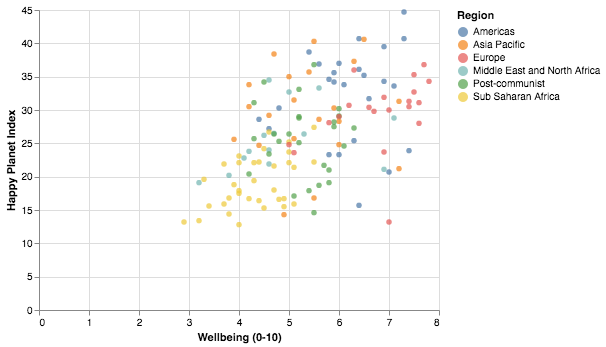

In [7]:
import altair as alt

selected_area = alt.selection_interval()
alt.Chart(hpi_df).mark_circle().encode(
    x='Wellbeing (0-10):Q',
    y='Happy Planet Index:Q',
    color=alt.condition(selected_area, 'Region:N', alt.value('lightgray'))
).add_selection(
    selected_area
)

Noticed what we did? We set the color parameter in encode function to an altair condition which retains the colors of only the points within selected area. This can be useful when you want to get insights into a particular range of features on the axes of the scatter plot. Let's go through an exercise to illustrate this.

#### Exercise: To generate a plot with selection, zoom, and hover/tooltip function

In this exercise, we will continue to work with the Happy Planet Index dataset. Your task is to create a scatter plot of Well-being vs Happy Planet Index, and zoom into the area with high Well-being and high Happy Planet index. Which region is predominant in this selection area? List the countries in this area.

1. Import the necessary modules and dataset.

In [8]:
import altair as alt
import pandas as pd

# Download the data from "https://github.com/abha-b/python_viz/blob/master/hpi_data_countries.tsv"
# Once downloaded, read it into a dataframe using pandas
hpi_df = pd.read_csv('hpi_data_countries.tsv', sep='\t')
hpi_df.head()

,HPI Rank,Country,Region,Life Expectancy (years),Wellbeing (0-10),Inequality of outcomes,Ecological Footprint (gha/capita),Happy Planet Index
0,1,Costa Rica,Americas,79.1,7.3,15%,2.8,44.7
1,2,Mexico,Americas,76.4,7.3,19%,2.9,40.7
2,3,Colombia,Americas,73.7,6.4,24%,1.9,40.7
3,4,Vanuatu,Asia Pacific,71.3,6.5,22%,1.9,40.6
4,5,Vietnam,Asia Pacific,75.5,5.5,19%,1.7,40.3


2. Create an altair scatter plot of Wellbeing vs. Happy Planet Index, along with the zoom feature using the interactive() function and zoom into the area on the set of data points on the top right.

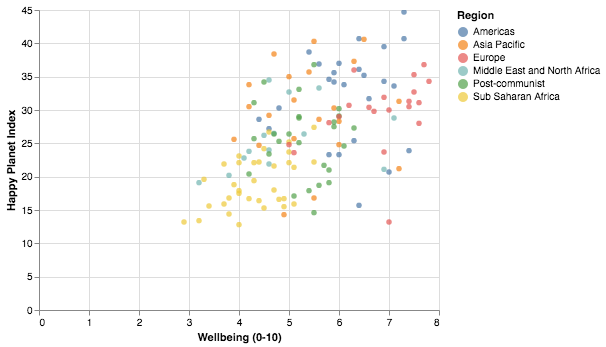

In [9]:
selected_area = alt.selection_interval()
alt.Chart(hpi_df).mark_circle().encode(
    x='Wellbeing (0-10):Q',
    y='Happy Planet Index:Q',
    color='Region:N'
).interactive()

3. Now add the selection feature by changing the color parameter to include the altair selection condition.

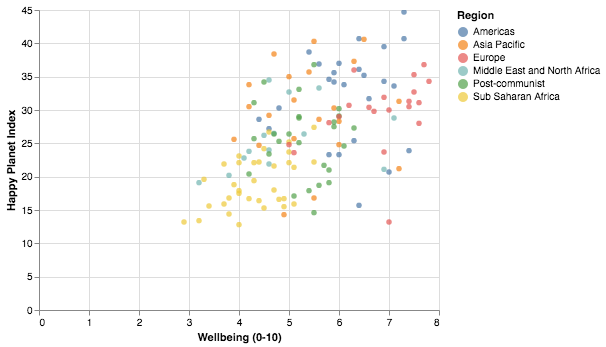

In [10]:
selected_area = alt.selection_interval()
alt.Chart(hpi_df).mark_circle().encode(
    x='Wellbeing (0-10):Q',
    y='Happy Planet Index:Q',
    color=alt.condition(selected_area, 'Region:N', alt.value('lightgray'))
).interactive().add_selection(
    selected_area
)

4. Observe that most countries in the selection area (top right) belong to the Americas (colored blue). Did you expect this based on your general knowledge? Let's add the the tooltip function to find out which countries appear in our area of interest.

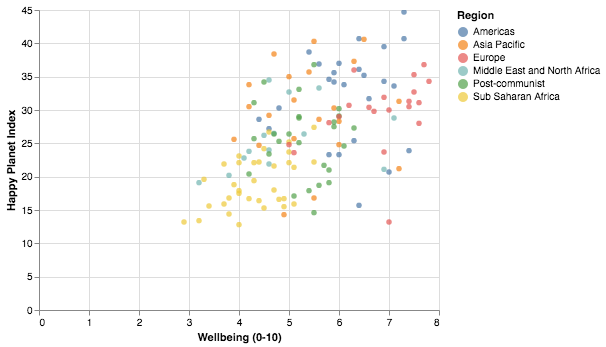

In [11]:
selected_area = alt.selection_interval()
alt.Chart(hpi_df).mark_circle().encode(
    x='Wellbeing (0-10):Q',
    y='Happy Planet Index:Q',
    color=alt.condition(selected_area, 'Region:N', alt.value('lightgray')),
    tooltip=['Country', 'Region', 'Wellbeing (0-10)', 'Happy Planet Index', 'Life Expectancy (years)']
).interactive().add_selection(
    selected_area
)

If you hover over the area of interest, you will see that the top countries are Costa Rica, Mexico, Panama, Colombia.

#### Selection across multiple plots

The selection function can be much more powerful when linked across multiple plots. We will consider the example of two scatter plots -- (1) wellbeing vs. happy planet index; and (2) life expectancy vs. happy planet index. 

Let's go step by step to generate the interactive plot.

Since we want the y-axis to be common, we will specify only the y-axis feature in the encode function on our altair Chart, and then add the x-axis features separately on the Chart object. Further, to put the two plots one after the other, we will use the altair `vconcat` function. See the code below for details:

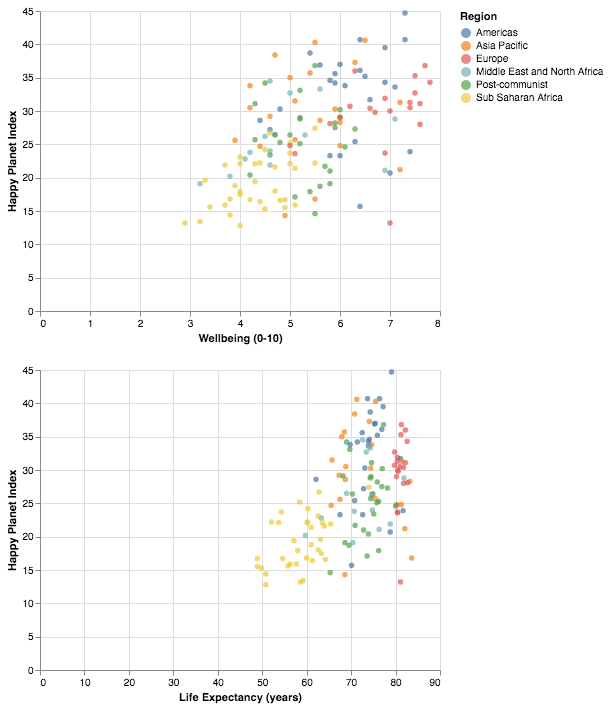

In [12]:
# multiple altair charts placed one after the other

chart = alt.Chart(hpi_df).mark_circle().encode(
    y='Happy Planet Index',
    color='Region:N'
)

chart1 = chart.encode(x='Wellbeing (0-10)')
chart2 = chart.encode(x='Life Expectancy (years)')
alt.vconcat(chart1, chart2)

We can also place the two plots <i>horizontally</i> next to each other with the `hconcat` function. Here's how:

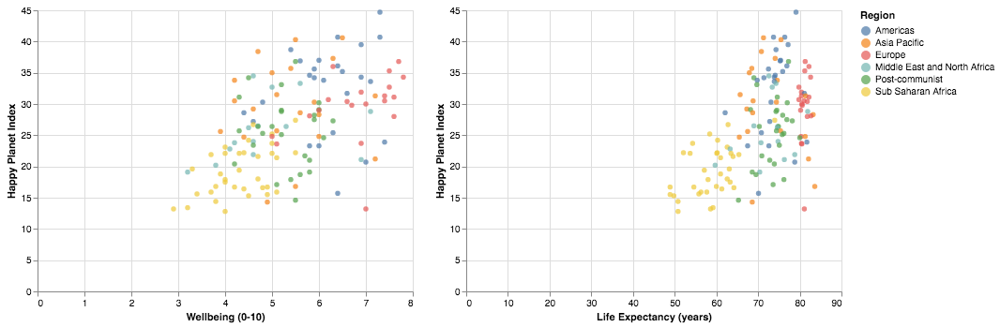

In [13]:
# multiple altair charts placed horizontally next to each other

chart = alt.Chart(hpi_df).mark_circle().encode(
    y='Happy Planet Index',
    color='Region:N'
)

chart1 = chart.encode(x='Wellbeing (0-10)')
chart2 = chart.encode(x='Life Expectancy (years)')
alt.hconcat(chart1, chart2)

By the way, there are shortcuts for the hconcat and vconcat functions. We can substitute `alt.hconcat(chart1, chart2)` with `chart1 | chart2` and `alt.vconcat(chart1, chart2)` with `chart1 & chart2`.

Now let's add the hover and tooltip function linking the two plots.

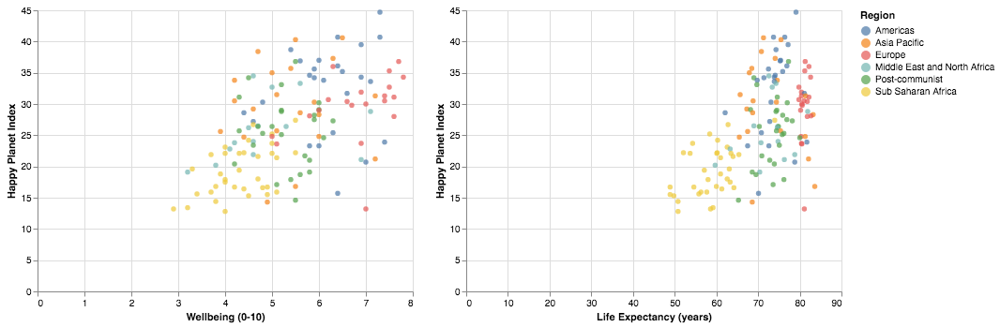

In [14]:
# hover and tooltip across multiple charts

selected_area = alt.selection_interval()
chart = alt.Chart(hpi_df).mark_circle().encode(
    y='Happy Planet Index',
    color=alt.condition(selected_area, 'Region', alt.value('lightgray'))
).add_selection(
    selected_area
)

chart1 = chart.encode(x='Wellbeing (0-10)')
chart2 = chart.encode(x='Life Expectancy (years)')
chart1 | chart2

Try selecting an area in either of the plots. You will notice that selection in one plot automatically leads to highlight the same data points in another plot. Isn't that cool? 

#### Selection based on values of a feature

So far, we used user input to create a rectangular area of selection using the selection_interval() function. Now, let's look at how to create a selection based on values of a feature. For example, suppose that at any instance, we want to select all countries belonging to a region of our choice -- Americas/Asia Pacific/Europe/Middle East and North Africa/Post-communist/Sub-Saharan Africa. We can do this using a selection function called selection_single() instead of the selection_interval():

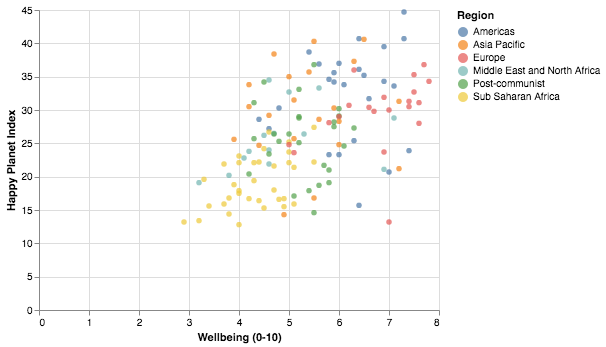

In [15]:
input_dropdown = alt.binding_select(options=list(set(hpi_df.Region)))
selected_points = alt.selection_single(fields=['Region'], bind=input_dropdown, name='Select')
color = alt.condition(selected_points,
                    alt.Color('Region:N'),
                    alt.value('lightgray'))

alt.Chart(hpi_df).mark_circle().encode(
    x='Wellbeing (0-10):Q',
    y='Happy Planet Index:Q',
    color=color,
    tooltip='Region:N'
).add_selection(
    selected_points
)

The plot above initially has all its data points in color. However, as you select a value for the feature Region from the input dropdown, you observe that the corresponding countries are highlighted in color, while all the other countries are grayed out. That is quite nice!

Can you identify the modifications required in the code to add the input dropdown feature?

1. Create an input_dropdown variable using the binding_select() function and set the parameter `options` to the list of regions in our dataset.

2. Use the selection_single() function to get a selected set of data points. If you study the code carefully, you will find that the parameters for this function are self-explanatory. For any clarifications, please read about them on the [official documentation](https://altair-viz.github.io/user_guide/generated/api/altair.selection_single.html).

3. Use the variable color to store the condition under which data points will be selected, the colors assigned to datapoints within and outside of the selection.

Tips/notes on selection and highlighting: There are a variety of ways to do selection and highlighting in altair interactive plots. You can learn more about them  at https://altair-viz.github.io/user_guide/interactions.html

### Assessment questions

Among the following, identify the option that is false: <br />
a) No interactive elements can be added to an altair scatter plot without using the interactive() function <br />
b) In an altair scatter plot, selection_interval() is a function used to create an area of selection for highlighting, whereas selection_single() is used to select a set of data points for highlighting <br />
c) To link selection to an altair scatter plot, the add_selection() function must be used with the parameter being set to returned value of a function like selection_interval() or selection_single() <br />
d) The tooltip parameter is used to specify the list of features to be displayed as the cursor is moved across an altair plot <br />
Answer: a

Which of the following is used to add the ability to zoom in and out in an altair scatter plot<br />
a) adding a zoom() function<br />
b) setting a parameter zoom=True <br />
c) adding a interactive() function<br />
d) none of the above <br />
Answer: c

Which of the following is a valid way to specify data types in altair?: <br />
a) Adding the suffix :Q to quantitative features <br />
b) Adding the suffix :N to nominal features <br />
c) Adding the suffix :O to ordinal features <br />
d) all of the above <br />
Answer: d

### Topic summary

In this section, we presented an overview of the important ways in which you can harness the capabilities of altair in making interactive scatter plots. Specifically, we learnt:
- how to generate a scatter plot using the altair Chart() function to which interactive components can be added
- how to add interactivity in a scatter plot in the form of zooming in and out with the interactive() function
- how to add interactivity in a scatter plot in the form of hovering and displaying information regarding data points based on cursor movement, with the tooltip parameter
- how to add interactivity in a scatter plot in the form of selections and highlighting with the selection_interval() and selection_single() functions, and also how to link selections across multiple scatter plots

In the next topic, we will learn how to use altair to create interactive bar charts.

## Other interactive plots in altair

Now that we know how to add interactivity in scatter plots, let's learn how to introduce interactivity in two other important visualization types -- bar plots and heatmaps.

### Bar plots

Let's first see an example of how to create a simple (static) bar chart in altair -- the mean Happy Planet Index of each region.

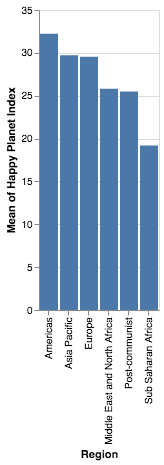

In [16]:
import altair as alt

alt.Chart(hpi_df).mark_bar().encode(
    x='Region:N',
    y='mean(Happy Planet Index):Q',
)

That was easy! Did you notice that we simply had to set the y parameter to 'mean(Happy Planet Index)' to get the mean per region?

But the plot looks a bit too narrow. We can easily fix this by setting the plot width to a different value using the properties function like in the code below

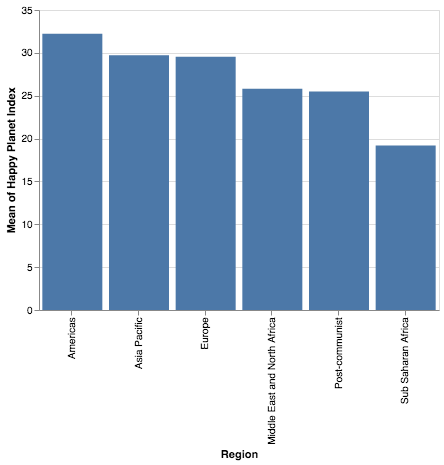

In [17]:
import altair as alt

alt.Chart(hpi_df).mark_bar().encode(
    x='Region:N',
    y='mean(Happy Planet Index):Q',
).properties(width=400)

Wonder if you can make the plot zoom in and out? Let's give it a try by adding the interactive() function.

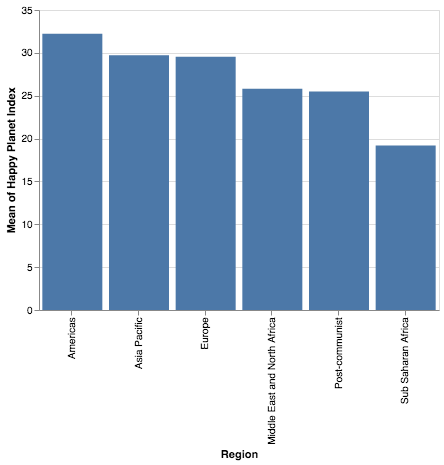

In [18]:
import altair as alt

alt.Chart(hpi_df).mark_bar().encode(
    x='Region:N',
    y='mean(Happy Planet Index):Q',
).properties(width=400).interactive()

And it works! Try zooming in and out on the above plot if you don't believe it. :)

Now let's add a line to show the mean of Happy Planet Index across all regions. Any ideas on how to do this? May be use the `|` operator we saw in the previous section?

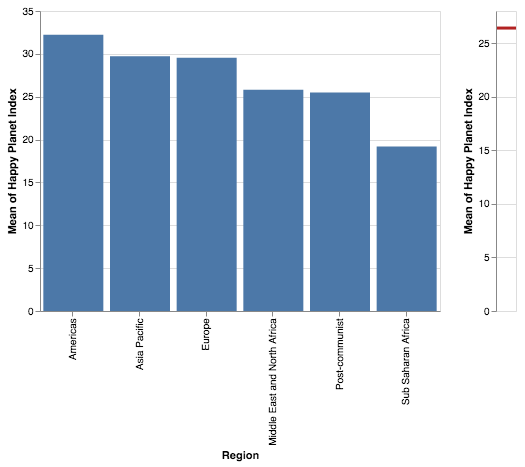

In [19]:
import altair as alt

bars = alt.Chart(hpi_df).mark_bar().encode(
    x='Region:N',
    y='mean(Happy Planet Index):Q',
).properties(width=400)

line = alt.Chart(hpi_df).mark_rule(color='firebrick').encode(
    y='mean(Happy Planet Index):Q',
    size=alt.SizeValue(3)
)

bars | line

Nah, that's not what we wanted. We don't want the line to be placed next to our bar plot. We want it <i>on</i> the plot. So how do we do it? For this, we need to use the layer concept in altair. The idea is to create variables to store the bar plot and line plot, and then <i>layer</i> it one on top of the other. See the code below to see how:

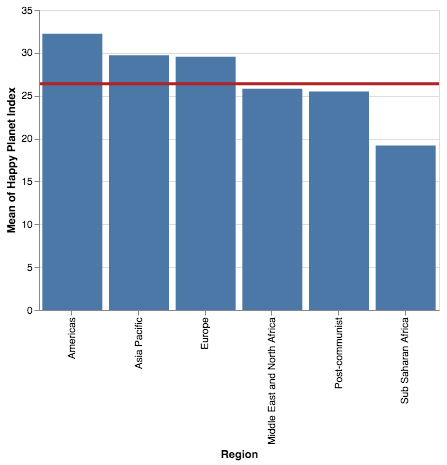

In [20]:
import altair as alt

bars = alt.Chart().mark_bar().encode(
    x='Region:N',
    y='mean(Happy Planet Index):Q',
).properties(width=400)

line = alt.Chart().mark_rule(color='firebrick').encode(
    y='mean(Happy Planet Index):Q',
    size=alt.SizeValue(3)
)

alt.layer(bars, line, data=hpi_df)

So now we know that the mean Happy Planet Index across all regions is around 26. Looks like there's a lot more happiness our planet can take. :)

By the way, you should also note that we didn't specify the dataset until we used the layer function. That is, we did not provide the dataset hpi_df in the Chart() function as we would usually do. Instead, we mentioned it in the layer function with the parameter `data=hpi_df`.

Now that you know the concept of layering in altair, you can be trusted with a shortcut for the same. :) Just write code independently for different plots as would usually you write and then use the `+` operator!

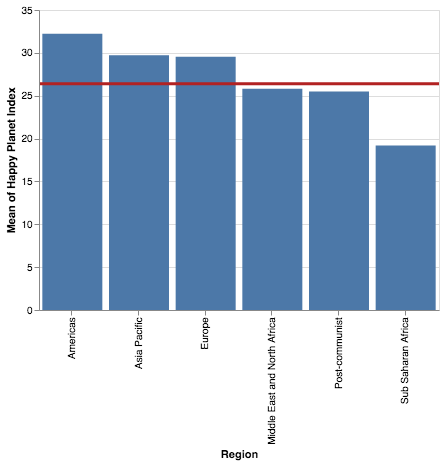

In [21]:
import altair as alt

bars = alt.Chart(hpi_df).mark_bar().encode(
    x='Region:N',
    y='mean(Happy Planet Index):Q',
).properties(width=400)

line = alt.Chart(hpi_df).mark_rule(color='firebrick').encode(
    y='mean(Happy Planet Index):Q',
    size=alt.SizeValue(3)
).interactive()

bars + line

Now let's add some interactivity to our plot. Say I want to be able to see the mean Happy Planet Index of any set of bars that I select using a click and drag mechanism. The following code in altair would do it for you:

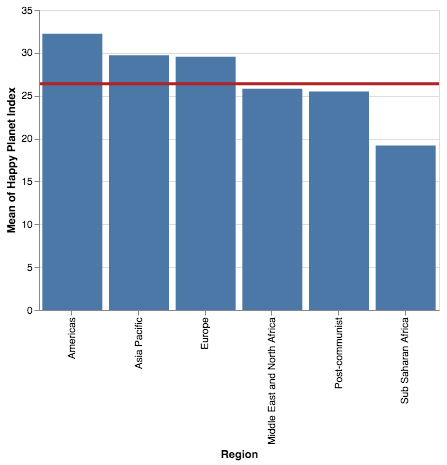

In [22]:
import altair as alt

selected_bars = alt.selection(type='interval', encodings=['x'])

bars = alt.Chart(hpi_df).mark_bar().encode(
    x='Region:N',
    y='mean(Happy Planet Index):Q',
    opacity=alt.condition(selected_bars, alt.OpacityValue(1), alt.OpacityValue(0.7)),
).properties(width=400).add_selection(
    selected_bars
)

line = alt.Chart(hpi_df).mark_rule(color='firebrick').encode(
    y='mean(Happy Planet Index):Q',
    size=alt.SizeValue(3)
).transform_filter(
    selected_bars
)

bars + line

Did you play around with the plot above? You can use the click and drag mechanism to select any set of bars and see how the line indicating the mean Happy Planet Index shifts accordingly. For example, if you select the three bars on the left (Americas, Asia Pacific, Europe), you will notice that mean HPI is around 31. If you select the three bars on the right (Middle East and North Africa, Post-communist, Sub-Saharan Africa), the mean HPI would be shown around 24.

### Heatmaps

Now let's use altair to create a heatmap indicating the number of countries with HPI and Wellbeing in various ranges.

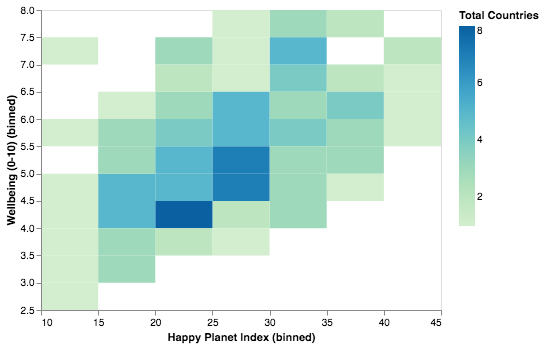

In [23]:
import altair as alt

alt.Chart(hpi_df).mark_rect().encode(
    alt.X('Happy Planet Index:Q', bin=True),
    alt.Y('Wellbeing (0-10):Q', bin=True),
    alt.Color('count()',
        scale=alt.Scale(scheme='greenblue'),
        legend=alt.Legend(title='Total Countries')
    )
)

Did you notice how easy it was to bin the Happy Planet Index and Wellbeing features? We simply has to set a parameter bin to True. Altair is lovely! 

Now, let's make our heatmap interactive by adding the zoom capability.

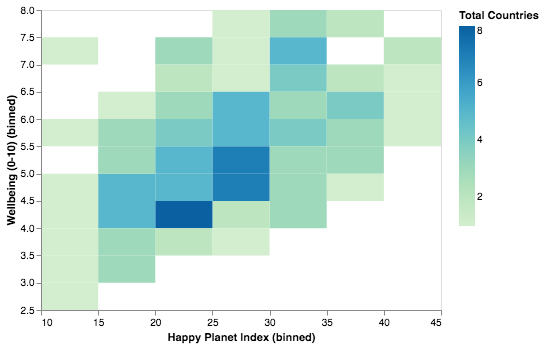

In [24]:
import altair as alt

alt.Chart(hpi_df).mark_rect().encode(
    alt.X('Happy Planet Index:Q', bin=True),
    alt.Y('Wellbeing (0-10):Q', bin=True),
    alt.Color('count()',
        scale=alt.Scale(scheme='greenblue'),
        legend=alt.Legend(title='Total Countries')
    )
).interactive()

Just as we can use a color pallette to indicate the number of countries in each cell of the heatmap, we can also draw circles with varying sizes on a heatmap to indicate the number of countries. See below for an example:

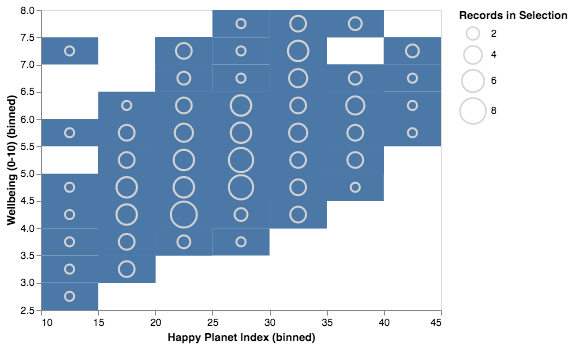

In [25]:
import altair as alt

heatmap = alt.Chart(hpi_df).mark_rect().encode(
    alt.X('Happy Planet Index:Q', bin=True),
    alt.Y('Wellbeing (0-10):Q', bin=True)
)

circles = heatmap.mark_point().encode(
    alt.ColorValue('lightgray'),
    alt.Size('count()',
        legend=alt.Legend(title='Records in Selection')
    )
)

heatmap + circles

#### Exercise: A bar plot and a heatmap next to each other

In this exercise, we will continue to work with the HPI dataset. The objective is to draw a bar plot depicting the number of countries in each region and a heatmap next to it, indicating the number of countries in various ranges of wellbeing and life-expectancy.

1. Import the necessary modules and dataset.

In [26]:
import altair as alt
import pandas as pd

# Download the data from "https://github.com/abha-b/python_viz/blob/master/hpi_data_countries.tsv"
# Once downloaded, read it into a dataframe using pandas
hpi_df = pd.read_csv('hpi_data_countries.tsv', sep='\t')
hpi_df.head()

,HPI Rank,Country,Region,Life Expectancy (years),Wellbeing (0-10),Inequality of outcomes,Ecological Footprint (gha/capita),Happy Planet Index
0,1,Costa Rica,Americas,79.1,7.3,15%,2.8,44.7
1,2,Mexico,Americas,76.4,7.3,19%,2.9,40.7
2,3,Colombia,Americas,73.7,6.4,24%,1.9,40.7
3,4,Vanuatu,Asia Pacific,71.3,6.5,22%,1.9,40.6
4,5,Vietnam,Asia Pacific,75.5,5.5,19%,1.7,40.3


2. Generate the required bar chart.

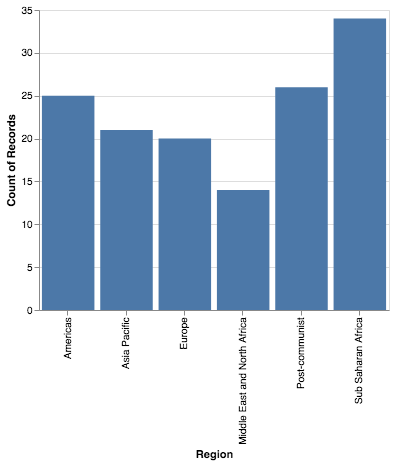

In [27]:
alt.Chart(hpi_df).mark_bar().encode(
    x='Region:N',
    y='count():Q',
).properties(width=350)

3. Generate the required heatmap.

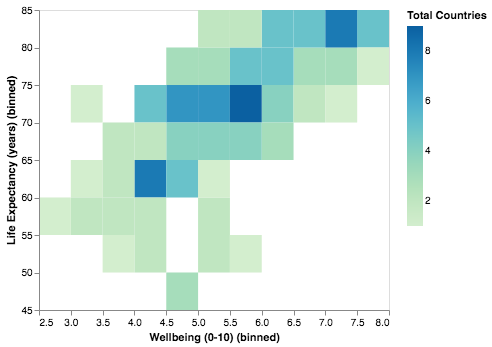

In [28]:
alt.Chart(hpi_df).mark_rect().encode(
    alt.X('Wellbeing (0-10):Q', bin=True),
    alt.Y('Life Expectancy (years):Q', bin=True),
    alt.Color('count()',
        scale=alt.Scale(scheme='greenblue'),
        legend=alt.Legend(title='Total Countries')
    )
).properties(width=350)

4. Merge the code to place the bar chart and heatmap next to each other.

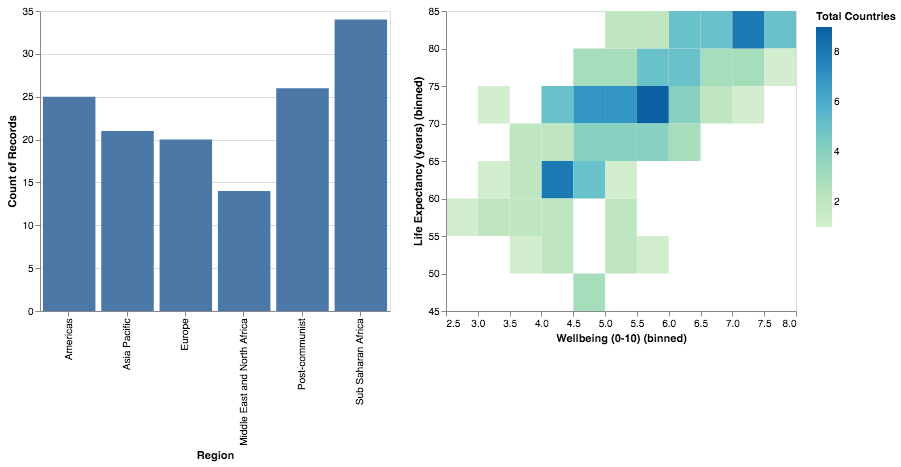

In [29]:
bars = alt.Chart(hpi_df).mark_bar().encode(
    x='Region:N',
    y='count():Q',
).properties(width=350)

heatmap = alt.Chart(hpi_df).mark_rect().encode(
    alt.X('Wellbeing (0-10):Q', bin=True),
    alt.Y('Life Expectancy (years):Q', bin=True),
    alt.Color('count()',
        scale=alt.Scale(scheme='greenblue'),
        legend=alt.Legend(title='Total Countries')
    )
).properties(width=350)

bars | heatmap

Well done!

### Linking a bar plot and a heatmap 

Now onto a much more interesting exercise - linking the bar chart with the heatmap we generated in the exercise.

Consider a scenario where you want to be able to click on any of the bars in the bar chart and have an updated heatmap  corresponding to the region represented by the bar. So, for instance, you would want to update the Life Expectancy vs Well Being heatmap only for the countries in a particular region, we can make this work with the following code.

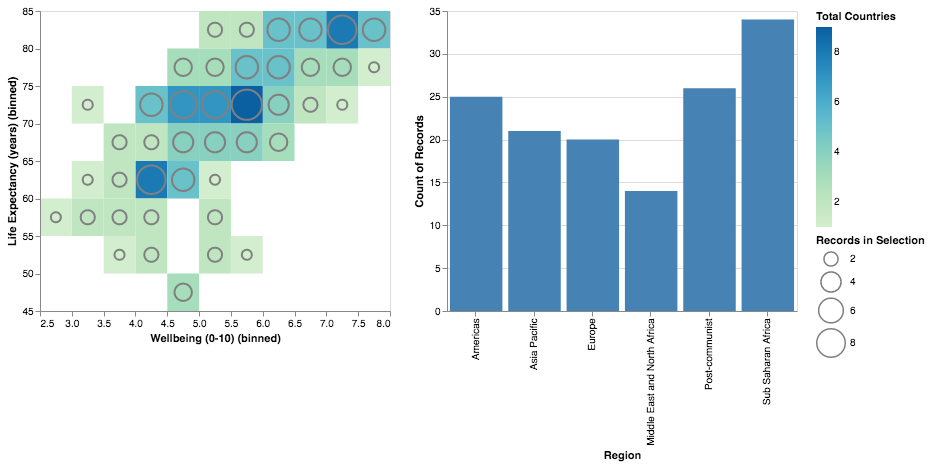

In [30]:
selected_region = alt.selection(type="single", encodings=['x'])

heatmap = alt.Chart(hpi_df).mark_rect().encode(
    alt.X('Wellbeing (0-10):Q', bin=True),
    alt.Y('Life Expectancy (years):Q', bin=True),
    alt.Color('count()',
        scale=alt.Scale(scheme='greenblue'),
        legend=alt.Legend(title='Total Countries')
    )
).properties(
    width=350
)

circles = heatmap.mark_point().encode(
    alt.ColorValue('grey'),
    alt.Size('count()',
        legend=alt.Legend(title='Records in Selection')
    )
).transform_filter(
    selected_region
)

bars = alt.Chart(hpi_df).mark_bar().encode(
    x='Region:N',
    y='count()',
    color=alt.condition(selected_region, alt.ColorValue("steelblue"), alt.ColorValue("grey"))
).properties(
    width=350
).add_selection(selected_region)

heatmap + circles | bars

Spend some time playing around with the visualization and studying the code. Did you notice how we used both the color pallette and circles on the heatmap? As you click on each bar chart, you will find that the color palette indicating the total countries in a certain range of well-being and life-expectancy remains constant, whereas the circles get updated to reflect the number of countries in the corresponding range for the selected region. Making intelligent design choices such as these will not only increase the understanding of your audience about your dataset, but also help you present your data with confidence and ease.

Notes on altair interactive plots: Altair is a rich library designed to build both simple and complex interactive visualizations with ease. Due to time and space limitations, it is impossible to cover them comprehensively in any chapter. Therefore, we encourage the reader to build on the foundations laid in this chapter, and study the examples on the altair official Example Gallery at https://altair-viz.github.io/gallery/index.html. This will equip you with a deeper understanding of the visualization possibilities in altair.

### Assessment questions

Which of the following is used to place plots next to each other in altair: </br>
a) the hconcat() and vconcat() functions</br>
b) the | and & operator </br>
c) neither a nor b </br>
d) both a and b </br>
Answer: d </br>

Which of the following is not a function to generate elements of an altair plot: </br>
a) mark_bar() </br>
b) mark_dot() </br>
c) mark_circle() </br>
d) mark_rect() </br>
Answer: b</br>

### Topic summary

In this section, we presented an overview of some important ways to add interactivity in bar plots and heatmaps. Specifically, we learnt:
- how to generate a bar plot using the altair mark_bar() function 
- how to generate a heatmap using the altair mark_rect() function, and use color palettes and circles to visually represent heatmap data
- how to add zooming capabilities in a bar plots and heatmaps using the interactive() function
- how to use the layering capability in altair to present plots on top of each other using the layer() function or `+` operator
- how to dynamically link bar plots and heatmaps to create a single compelling visualization

We also directed the reader to the official documentation and official example gallery to explore altair so as to be aware of the wide variety of visualization types possible in altair.

## Chapter-level Activity

We will be working with the [Google Play Store Apps](https://www.kaggle.com/lava18/google-play-store-apps) dataset on Kaggle. Your task is to create a visualization with (a) bar plot of number of apps stratified by each 'Content Rating' category (i.e. rated by Everyone/Teen/etc.) and (b) a heatmap indicating number of apps stratified by app 'Category' and binned ranges of 'Rating'. The user should be able to interact with the plot by selecting any of the Content Rating types and the corresponding change should reflect in the heatmap to only include number of apps in that 'Content Rating' Category.

### High-level steps:

1. Download the Kaggle dataset hosted in the course github repository, and format it as pandas dataframe:
2. Remove the entries in the dataframe that have feature values NA.
3. Create the required bar plot of number of apps in each 'Content Rating' category of app.
4. Create the required heatmap indicating number of apps across app Category and Rating ranges.
5. Merge the code for bar chart and heatmap and create a visualization with both plots linked dynamically to each other.

### Solution steps:

1. Download the Kaggle dataset hosted in the course github repository, and format it as pandas dataframe:

In [31]:
# load pandas library
import pandas as pd

# download file 'googleplaystore.csv' from course github repository: https://github.com/chandrasg/pyviz/
# read the dataset as a pandas dataframe
gps_apps_df = pd.read_csv('/Users/chandrasg/Documents/googleplaystore.csv')
#worldrank_df = pd.read_csv('/Users/packt_pyviz/Documents/googleplaystore.csv')

# preview dataframe
gps_apps_df.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up


2. Remove the entries in the dataframe that have feature values NA.

In [32]:
gps_apps_df = gps_apps_df.dropna()

3. Create the required bar chart of number of apps in each 'Content Rating' category of app, i.e. whether the app is rated by Adults only 18+/Everyone/Everyone 10+/Mature 17+/Teen/Unrated.

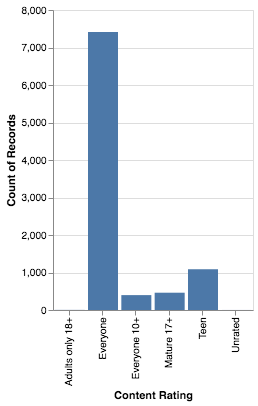

In [33]:
# import altair
import altair as alt

alt.data_transformers.enable('default', max_rows=None)

# create bar plot
alt.Chart(gps_apps_df).mark_bar().encode(
    x='Content Rating:N',
    y='count():Q'
).properties(width=200)

4. Create the required heatmap indicating number of apps across app Category and Rating ranges.

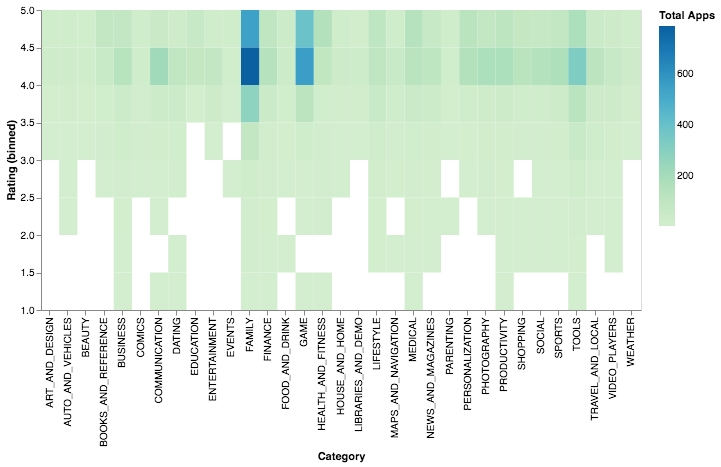

In [34]:
# create heatmap
alt.Chart(gps_apps_df).mark_rect().encode(
    alt.X('Category:N'),
    alt.Y('Rating:Q', bin=True),
    alt.Color('count()',
        scale=alt.Scale(scheme='greenblue'),
        legend=alt.Legend(title='Total Apps')
    )
).properties(
    width=600
)

5. Merge the code for bar chart and heatmap and create a visualization with both plots linked dynamically to each other such that selection in the bar chart reflects in changes on the heatmap.

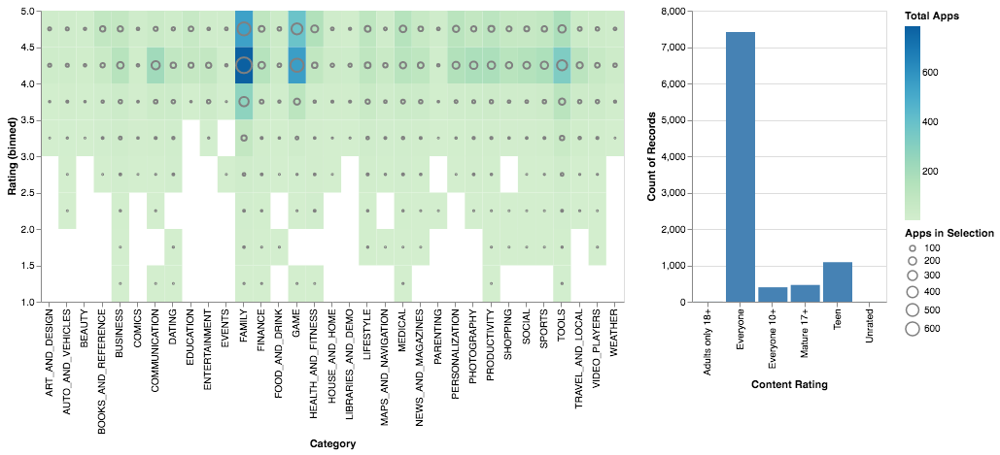

In [35]:
# define selection
selected_category = alt.selection(type="single", encodings=['x'])

# heatmap
heatmap = alt.Chart(gps_apps_df).mark_rect().encode(
    alt.X('Category:N'),
    alt.Y('Rating:Q', bin=True),
    alt.Color('count()',
        scale=alt.Scale(scheme='greenblue'),
        legend=alt.Legend(title='Total Apps')
    )
).properties(
    width=600
)

# circles to be placed on the heatmap
circles = heatmap.mark_point().encode(
    alt.ColorValue('grey'),
    alt.Size('count()',
        scale=alt.Scale(domain=(1, 600), range=(1, 200)),
        legend=alt.Legend(title='Apps in Selection')
    )
).transform_filter(
    selected_category
)

# bar plot
bars = alt.Chart(gps_apps_df).mark_bar().encode(
    x='Content Rating:N',
    y='count()',
    color=alt.condition(selected_category, alt.ColorValue("steelblue"), alt.ColorValue("grey"))
).properties(
    width=200
).add_selection(selected_category)

# layering and hconcat
heatmap + circles | bars

And that's it. Congratulations!

## Chapter-level Summary

In this chapter, we learnt how to create visualizations that respond to selection of specific strata in the dataset. For illustration, we used the Happy Planet Index dataset of 140 countries, where we created a variety of plots with stratification based on different region to which countries belonged. We generated scatter plots, bar plots, and heatmaps with interactive features such as zooming in and out, tooltipping, selection of data points in a user-specified interval, selection of data points belonging specific strata. We also generated more complex visualizations with multiple plots interlinked with each other and which dynamically respond to user inputs.

In the next chapter, we will learn how to create interactive visualization of data across time.

## Chapter-level Quiz

State which of the following is false: </br>
a) Altair code for building interactive visualization is verbose compared to codes in libraries such as plotly </br>
a) The encoding concept in altair refers to the mapping of aspects of data to aspects of visualization. </br>
a) 'Channels' in altair refer to the means to map data to visualization, and are specified in the form of function parameters. </br>
a) Altair is a library with limited options for introducing interactivity. </br>
Answer: d</br>

Which function in altair would you use for layering one plot on top of another?: </br>
a) the '+' operator </br>
b) the layer() function </br>
c) either a or b </br>
b) neither a nor b </br>
Answer: c </br>
